<a href="https://colab.research.google.com/github/aksha1234/akshay-/blob/master/Course_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('course-real-worl-data-pubg')
jovian.set_colab_id('1jvqxEpJ2dJQvfmreC4uMxTvFY-Wq2aqP')

# Data Description
<font size = 3> In a PUBG game, up to 100 players start in each match (matchId). Players can be on teams (groupId) which get ranked at the end of the game (winPlacePerc) based on how many other teams are still alive when they are eliminated. In game, players can pick up different munitions, revive downed-but-not-out (knocked) teammates, drive vehicles, swim, run, shoot, and experience all of the consequences -- such as falling too far or running themselves over and eliminating themselves.

You are provided with a large number of anonymized PUBG game stats, formatted so that each row contains one player's post-game stats. The data comes from matches of all types: solos, duos, squads, and custom; there is no guarantee of there being 100 players per match, nor at most 4 player per group.

You must create a model which predicts players' finishing placement based on their final stats, on a scale from 1 (first place) to 0 (last place).

# Data fields

- DBNOs - Number of enemy players knocked.
- assists - Number of enemy players this player damaged that were killed by teammates.
- boosts - Number of boost items used.
- damageDealt - Total damage dealt. Note: Self inflicted damage is subtracted.
- headshotKills - Number of enemy players killed with headshots.
- heals - Number of healing items used.
- Id - Player’s Id
- killPlace - Ranking in match of number of enemy players killed.
- killPoints - Kills-based external ranking of player. (Think of this as an Elo ranking where only kills matter.) If there is a value other than -1 in rankPoints, then any 0 in killPoints should be treated as a “None”.
- killStreaks - Max number of enemy players killed in a short amount of time.
- kills - Number of enemy players killed.
- longestKill - Longest distance between player and player killed at time of death. This may be misleading, as downing a player and driving away may lead to a large longestKill stat.
- matchDuration - Duration of match in seconds.
- matchId - ID to identify match. There are no matches that are in both the training and testing set.
- matchType - String identifying the game mode that the data comes from. The standard modes are “solo”, “duo”, “squad”, “solo-fpp”, “duo-fpp”, and “squad-fpp”; other modes are from events or custom matches.
- rankPoints - Elo-like ranking of player. This ranking is inconsistent and is being deprecated in the API’s next version, so use with caution. Value of -1 takes place of “None”.
- revives - Number of times this player revived teammates.
- rideDistance - Total distance traveled in vehicles measured in meters.
- roadKills - Number of kills while in a vehicle.
- swimDistance - Total distance traveled by swimming measured in meters.
- teamKills - Number of times this player killed a teammate.
- vehicleDestroys - Number of vehicles destroyed.
- walkDistance - Total distance traveled on foot measured in meters.
- weaponsAcquired - Number of weapons picked up.
- winPoints - Win-based external ranking of player. (Think of this as an Elo ranking where only winning matters.) If there is a value other than -1 in rankPoints, then any 0 in winPoints should be treated as a “None”.
- groupId - ID to identify a group within a match. If the same group of players plays in different matches, they will have a different groupId each time.
- numGroups - Number of groups we have data for in the match.
- maxPlace - Worst placement we have data for in the match. This may not match with numGroups, as sometimes the data skips over placements.
- winPlacePerc - The target of prediction. This is a percentile winning placement, where 1 corresponds to 1st place, and 0 corresponds to last place in the match. It is calculated off of maxPlace, not numGroups, so it is possible to have missing chunks in a match.

![pubg](https://www.nsbpictures.com/wp-content/uploads/2018/11/Pubg-PNG-HD-614x721.png)

## Loading dataset 

In [ ]:

!pip install opendatasets --upgrade --q
import os
import opendatasets as od

In [ ]:
url='https://www.kaggle.com/c/pubg-finish-placement-prediction/data'
od.download(url)

Skipping, found downloaded files in "./pubg-finish-placement-prediction" (use force=True to force download)


## Importing the Libraries 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import plotly.express as px
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## Loading the data 

In [ ]:
train_df=pd.read_csv('pubg-finish-placement-prediction/train_V2.csv')
test_df=pd.read_csv('pubg-finish-placement-prediction/test_V2.csv')
sample_df=pd.read_csv('pubg-finish-placement-prediction/sample_submission_V2.csv')

In [ ]:
## checking the dimension of data dataframe
train_df.shape

(4446966, 29)

**As we can see the data here is around 4.4 million which is very large lets convert it into 5 lakhs number of rows and to have distribution from overall we will take the  random sample .**

In [ ]:
train_df=train_df.sample(500000,random_state=42)

## EDA

In [ ]:
train_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
4289863,ab772932dc284b,6f0931849c42fc,7558d7990b8795,0,0,161.3,3,2,0,7,1607,4,3,41.540,1377,squad-fpp,29,29,-1,1,0.0,0,0.00,0,0,565.300,2,1660,0.3929
3353859,f6e963587e1e61,f2724371458701,55d030157d6eb8,0,3,191.5,1,1,4,7,0,3,1,4.140,899,crashfpp,40,38,1500,0,1580.0,1,0.00,0,0,532.600,3,0,0.6923
1660760,eae2ba6cc7de4c,a8ddca0c7e8f74,0cf8e1dc70559e,0,2,100.0,0,0,1,24,1700,1,1,64.250,1324,solo-fpp,97,97,-1,0,450.7,0,0.00,0,0,1607.000,6,1593,0.7083
2555773,36d45a7e95b913,916c4c31723cdb,7b572f22974581,0,0,0.0,0,0,0,86,0,0,0,0.000,1307,squad,27,24,1500,0,0.0,0,0.00,0,0,134.600,1,0,0.1154
363725,aa5867db86503b,76d57fc80f70f2,fc69844a437eae,3,2,289.9,2,0,9,14,0,2,1,22.460,1864,squad-fpp,28,26,1456,1,3950.0,0,0.00,0,0,2131.000,5,0,0.8148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
335401,e937dd462140de,b91bc210a9e3e4,ae407d77b9c3c8,0,1,159.8,0,0,2,67,0,0,0,0.000,1868,solo-fpp,94,92,1510,0,0.0,0,0.00,0,0,564.300,8,0,0.4086
948971,42766a682ac9b6,baa9cd2723ce22,2bf2efb5926d5b,0,0,212.5,1,0,0,35,1079,1,1,7.232,1964,duo-fpp,45,45,-1,0,0.0,0,0.00,0,0,218.100,2,1473,0.2045
4323850,77c1d3533aded7,a7ad188b1cf646,0f2f43208752de,2,2,128.5,0,1,5,26,0,1,1,96.310,1278,squad-fpp,27,27,1489,0,0.0,0,0.00,0,0,4074.000,6,0,0.9615
517296,9bc68addb33940,29ad7d42a3b0a3,dc6e696450edf8,0,5,803.4,4,2,3,1,0,9,2,175.500,1388,duo-fpp,47,46,1527,0,0.0,0,73.32,0,0,2662.000,6,0,0.9783


In [ ]:
train_df.groupId.nunique()

444740

In [ ]:
test_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,0,0,0,0.00,1884,squad-fpp,28,28,1500,0,0.0,0,0.000,0,0,588.00,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,0,2,1,361.90,1811,duo-fpp,48,47,1503,2,4669.0,0,0.000,0,0,2017.00,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,0,0,0,0.00,1793,squad-fpp,28,27,1565,0,0.0,0,0.000,0,0,787.80,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,0,0,0,0.00,1834,duo-fpp,45,44,1465,0,0.0,0,0.000,0,0,1812.00,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,0,3,1,60.06,1326,squad-fpp,28,27,1480,1,0.0,0,0.000,0,0,2963.00,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1934169,a316c3a13887d5,80e82180c90951,f276da5fd73536,1,2,381.00,3,0,7,4,1294,4,2,69.27,1292,squad-fpp,22,20,-1,1,0.0,0,0.000,0,0,1799.00,5,1526
1934170,5312146b27d875,147264a127c56e,fb77cbfe094a6b,0,0,0.00,0,0,0,64,1449,0,0,0.00,1301,squad-fpp,27,26,-1,0,0.0,0,0.000,0,0,1195.00,3,1496
1934171,fc8818b5b32ad3,7bbb4779ebedd5,efb74d5f6e9779,0,0,91.96,0,0,3,24,0,1,1,25.38,1314,squad-fpp,29,29,1482,0,0.0,0,7.798,1,0,3327.00,3,0
1934172,a0f91e35f8458f,149a506a64c2b1,3a2cf335bc302f,1,2,138.60,0,0,12,25,0,1,1,67.89,1333,duo-fpp,49,48,1456,1,0.0,0,0.000,0,0,1893.00,4,0


In [ ]:
sample_df

,Id,winPlacePerc
0,9329eb41e215eb,1
1,639bd0dcd7bda8,1
2,63d5c8ef8dfe91,1
3,cf5b81422591d1,1
4,ee6a295187ba21,1
...,...,...
1934169,a316c3a13887d5,1
1934170,5312146b27d875,1
1934171,fc8818b5b32ad3,1
1934172,a0f91e35f8458f,1


>**As it can be seen from above that the Id groupId and matchId doesn't seems to be having their role in the predicting the winning percentage. Sol lets drop them.**

In [ ]:
input_col=train_df.columns[3:].tolist()

In [ ]:
input_col

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'matchType',
 'maxPlace',
 'numGroups',
 'rankPoints',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints',
 'winPlacePerc']

In [ ]:
target_col=train_df.columns[-1]

In [ ]:
target_col

'winPlacePerc'

### Checking the missing values if the dataframe is having .

In [ ]:
import missingno as msno

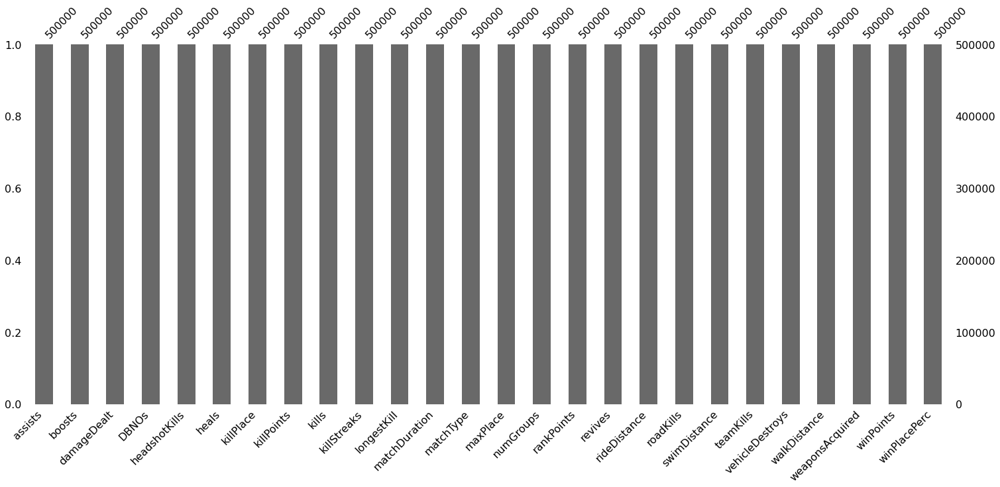

In [ ]:
msno.bar(train_df[input_col])

**As all the values are present in teh dataframe.**

**Checking the mathematical statstics of the dataframe .**

In [ ]:
train_df.describe()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
count,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000
mean,0.233216,1.103792,130.227498,0.656492,0.226146,1.365772,47.679038,504.028324,0.921186,0.542718,22.947971,1579.341048,44.550900,43.050280,893.154186,0.163622,604.726317,0.003694,4.496689,0.023842,0.008042,1149.795442,3.659788,605.447548,0.472192
std,0.587822,1.712204,169.924346,1.145646,0.596671,2.679732,27.469214,627.140688,1.551217,0.711013,50.975236,258.938213,23.843812,23.301787,736.539413,0.467579,1498.956562,0.080873,30.725677,0.166810,0.093174,1180.888412,2.461378,739.510691,0.307339
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,152.000000,2.000000,1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,1367.000000,28.000000,27.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,154.100000,2.000000,0.000000,0.200000
50%,0.000000,0.000000,83.830000,0.000000,0.000000,0.000000,48.000000,0.000000,0.000000,0.000000,0.000000,1438.000000,30.000000,30.000000,1444.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,681.800000,3.000000,0.000000,0.458300
75%,0.000000,2.000000,185.100000,1.000000,0.000000,2.000000,71.000000,1171.000000,1.000000,1.000000,21.250000,1851.000000,49.000000,47.000000,1500.000000,0.000000,0.174500,0.000000,0.000000,0.000000,0.000000,1966.000000,5.000000,1495.000000,0.740700
max,13.000000,18.000000,5557.000000,39.000000,23.000000,57.000000,100.000000,2122.000000,55.000000,18.000000,1005.000000,2237.000000,100.000000,100.000000,5513.000000,19.000000,35400.000000,18.000000,2718.000000,4.000000,4.000000,13310.000000,81.000000,1998.000000,1.000000


In [ ]:
## Checking the datatype of teh dataframe
train_df[input_col].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500000 entries, 4289863 to 2295339
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   assists          500000 non-null  int64  
 1   boosts           500000 non-null  int64  
 2   damageDealt      500000 non-null  float64
 3   DBNOs            500000 non-null  int64  
 4   headshotKills    500000 non-null  int64  
 5   heals            500000 non-null  int64  
 6   killPlace        500000 non-null  int64  
 7   killPoints       500000 non-null  int64  
 8   kills            500000 non-null  int64  
 9   killStreaks      500000 non-null  int64  
 10  longestKill      500000 non-null  float64
 11  matchDuration    500000 non-null  int64  
 12  matchType        500000 non-null  object 
 13  maxPlace         500000 non-null  int64  
 14  numGroups        500000 non-null  int64  
 15  rankPoints       500000 non-null  int64  
 16  revives          500000 non-nul

<font size = 5> We only have one categorical columns and 25 numerical cols.

### Finding out the correaltion between the various parametrs.

In [ ]:
train_corr=train_df.corr()

Text(0.5, 1.0, ' The correaltion distribution of the various paramter in winnning prediction ')

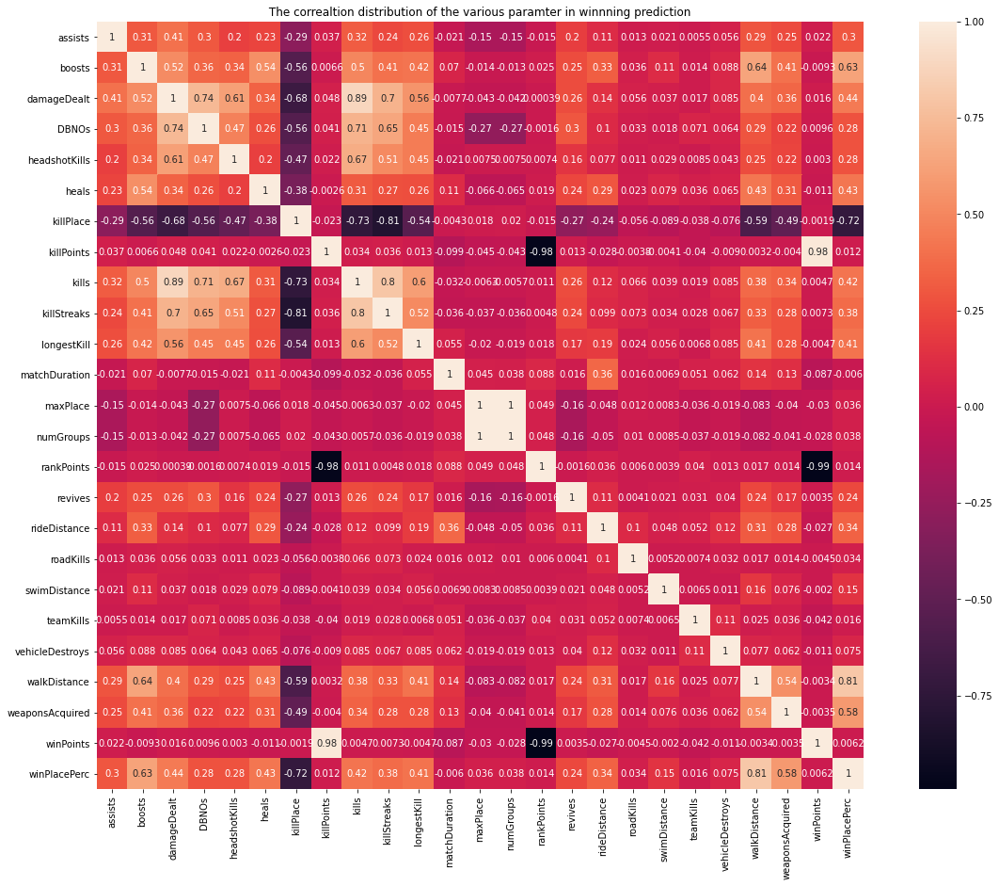

In [ ]:
plt.figure(figsize=(21,15))
sns.heatmap(data=train_corr,annot=True,square=True)
plt.title(' The correaltion distribution of the various paramter in winnning prediction ')

<font size = 5> The parameters which are having the correlation value > 0.2 considering to be significant role in influence in winning.

In [ ]:
## parametrs which influence positive to winnning prediction
influence_param=list(train_corr[target_col][train_corr[target_col]>0.2].index)[:-1]

### Lets check the distribution of the following parameters

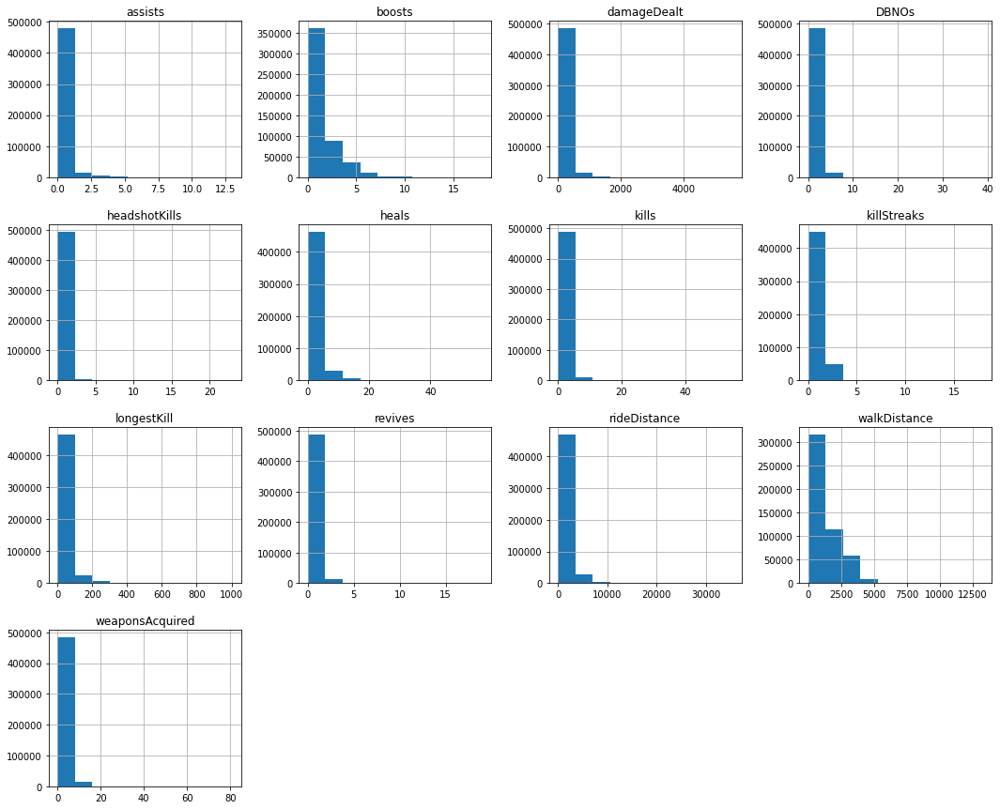

In [ ]:
train_df[influence_param].hist(figsize=(18,15));

<font size = 5> As it can be seen that all the columns seems to be skewed in the right.

- headshotKills= Most of the players havant killed single enemy players .
- weaponsAcquired- Most of teh the players havent acquired single weapons


In [ ]:
## checking the magnitude of teh skewness in the nfluential parameters.
train_df[influence_param].skew()

assists            3.553918
boosts             1.952475
damageDealt        2.900981
DBNOs              3.221617
headshotKills      4.425145
heals              3.470077
kills              3.273669
killStreaks        1.275072
longestKill        3.968360
revives            3.834075
rideDistance       3.376932
walkDistance       1.092071
weaponsAcquired    2.268316
dtype: float64

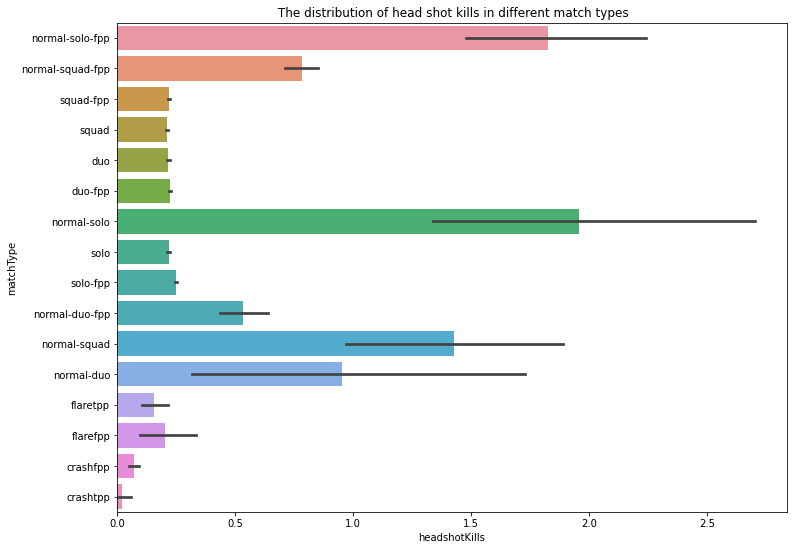

In [ ]:
## Let us see the distribution of headshotKills in different matchtype

plt.figure(figsize=(12,9))
plt.title(' The distribution of head shot kills in different match types')
sns.barplot(data=train_df.sort_values('headshotKills',ascending=False),x='headshotKills',y='matchType');

**The average max headshot kills can be seen in the `normal-solo` match.**

### **Lets check the maximum and minimum killed happen in the different matchtype.**

In [ ]:
head_shot_col=train_df.groupby('matchType')['headshotKills'].agg(['max','mean','sum'])
head_shot_col

,max,mean,sum
matchType,,,
crashfpp,2,0.070822,50
crashtpp,1,0.019231,1
duo,14,0.215686,7681
duo-fpp,13,0.224943,25258
flarefpp,3,0.202381,17
flaretpp,4,0.158249,47
normal-duo,6,0.954545,21
normal-duo-fpp,11,0.533913,307
normal-solo,12,1.957447,92


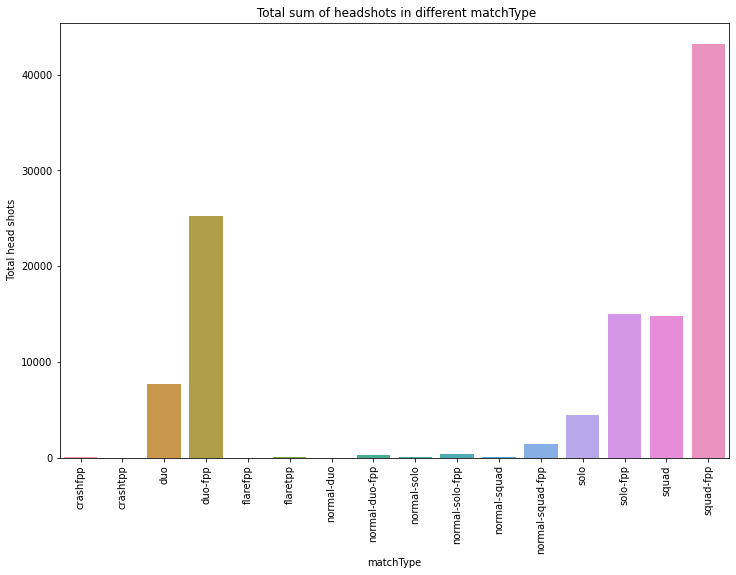

In [ ]:
plt.figure(figsize=(12,8))

sns.barplot(data=head_shot_col,x=head_shot_col.index,y='sum')
plt.title(' Total sum of headshots in different matchType');
plt.ylabel(' Total head shots')
plt.xticks(rotation=90);


-  Max number of total headshot happends in the `sqaud fpp` however the mean of the `normal solo` match is significantly higher than every match type.

## Feature Engineering

In [ ]:
input_cols=train_df.columns.tolist()[3:-1]
input_cols

['assists',
 'boosts',
 'damageDealt',
 'DBNOs',
 'headshotKills',
 'heals',
 'killPlace',
 'killPoints',
 'kills',
 'killStreaks',
 'longestKill',
 'matchDuration',
 'matchType',
 'maxPlace',
 'numGroups',
 'rankPoints',
 'revives',
 'rideDistance',
 'roadKills',
 'swimDistance',
 'teamKills',
 'vehicleDestroys',
 'walkDistance',
 'weaponsAcquired',
 'winPoints']

In [ ]:
numerical_cols=train_df[input_cols].select_dtypes(include=np.number).columns.tolist()

categorical_cols=train_df[input_cols].select_dtypes(include='object').columns.tolist()

categorical_cols

['matchType']

### Standardizing the numerical columns values so as to avoid teh disproportion in the prediction .

In [ ]:
from sklearn.preprocessing import  MinMaxScaler
scaler=MinMaxScaler().fit(train_df[numerical_cols])

In [ ]:
train_df[numerical_cols]=scaler.transform(train_df[numerical_cols])

### Now Encoding the matchtype

In [ ]:
from sklearn.preprocessing import OneHotEncoder


encoder=OneHotEncoder(sparse=False,handle_unknown='ignore').fit(train_df[categorical_cols])

encoded_cols=encoder.get_feature_names(categorical_cols).tolist()

train_df[encoded_cols]=encoder.transform(train_df[categorical_cols])


### Splitting the data into training and validation datasets 

In [ ]:
from sklearn.model_selection import train_test_split

input_df=train_df[numerical_cols+encoded_cols]
target_df=train_df[target_col]

train_inputs,val_inputs,train_targets,val_targets=train_test_split(input_df,target_df,test_size=0.35,random_state=42)

## Training and Predicting the model thorugh
1. RandomForestRegressor
2. XGBoost


## 1. RandomForestRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rgf1=RandomForestRegressor(random_state=42,n_jobs=-1,max_depth=6,n_estimators=20)

In [ ]:
%%time
rgf1.fit(train_inputs,train_targets)

pred_train=rgf1.predict(train_inputs)

pred_val=rgf1.predict(val_inputs)

print(' The score for the training model is {:.4f} %'.format(rgf1.score(train_inputs,train_targets)*100))

print(' The score for the validation model is {:.4f} %'.format(rgf1.score(val_inputs,val_targets)*100))



 The score for the training model is 86.3171 %
 The score for the validation model is 86.1033 %
CPU times: user 57.5 s, sys: 134 ms, total: 57.6 s
Wall time: 30.4 s


> Interpretation
**As it can be seen both score are comparable and hence overfit is not there.**

<font size =4> Top 10 important parameters which influences the winning percentage

In [ ]:
%%time
pd.DataFrame({'feature':numerical_cols+encoded_cols,'importance':rgf1.feature_importances_}).sort_values(by='importance',ascending=False).head(10)

CPU times: user 9.97 ms, sys: 10 µs, total: 9.98 ms
Wall time: 111 ms


,feature,importance
21,walkDistance,0.795486
6,killPlace,0.175945
13,numGroups,0.006994
12,maxPlace,0.004942
8,kills,0.004806
11,matchDuration,0.004711
1,boosts,0.003935
9,killStreaks,0.002529
3,DBNOs,0.000652
32,matchType_normal-solo,0.000000


#### **Lets tune the hyper-parameter with the help of a helper function.**

In [ ]:
%%time
def test_param_rfreg(**param):
  model=RandomForestRegressor(n_jobs=-1,random_state=42,**param).fit(train_inputs,train_targets)
  print(' The training model score is {:.4f}% \n The validation model score is {:.4f}%'.format(model.score(train_inputs,train_targets)*100,model.score(val_inputs,val_targets)*100))

CPU times: user 6 µs, sys: 0 ns, total: 6 µs
Wall time: 10.5 µs


In [ ]:
test_param_rfreg(n_estimators=50)

 The training model score is 98.8645% 
 The validation model score is 92.1055%


**Interpretation**

As it can be seen that the score of the current model is 92.1% which is significantly higher than the score of the former model was 86.18 % where the number of estimators is 20. Hence it can be conclude that more teh estimators more is the accuracy .

However we can see that in teh current model the difference between the training and validation set is significant hence teh model is overfittted.

In [ ]:
%%time
test_param_rfreg(max_features=0.5)

 The training model score is 98.9317% 
 The validation model score is 92.3057%
CPU times: user 7min 45s, sys: 3.47 s, total: 7min 48s
Wall time: 4min 2s


<font size = 4> As it can be seen the model with current hyperparameter has slightly higher score than the previous one.

**Let us plot the graph and test the different parameters.**

In [ ]:
## defining one helper function for tuning teh hyper-pramaters 
%%time
def test_and_plot_rforest(param_name,param_values):
    train_error,val_error=[],[]
    for value in param_values:
        param={param_name:value}
        model=RandomForestRegressor(n_estimators=30, n_jobs=-1,random_state=42,**param).fit(train_inputs,train_targets) ## We are reducing the number of estimators as it is taking too much timing for default 100 estimators
        train_err=1-model.score(train_inputs,train_targets)
        val_err=1-model.score(val_inputs,val_targets)
        train_error.append(train_err)
        val_error.append(val_err)
    ##Making the plot
    plt.figure(figsize=(12,9))
    plt.plot(param_values,train_error,'ro-')
    plt.plot(param_values,val_error,'bo-')
    plt.title(' The distribution of {} parameter'.format(param_name))
    plt.legend(['Training','Validation'])

CPU times: user 8 µs, sys: 0 ns, total: 8 µs
Wall time: 15.5 µs


<font size = 5> 1.Hyperparameter : Max-leaf_nodes  tuning. 

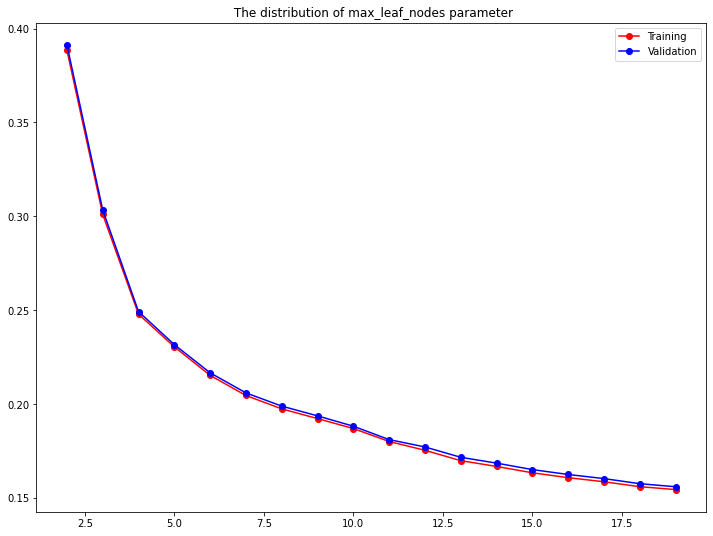

In [ ]:
test_and_plot_rforest('max_leaf_nodes',np.arange(2,20,1))

<font size = 5>2.Hyperparameter : min_samples_split  tuning. 

CPU times: user 2min 14s, sys: 523 ms, total: 2min 14s
Wall time: 1min 10s


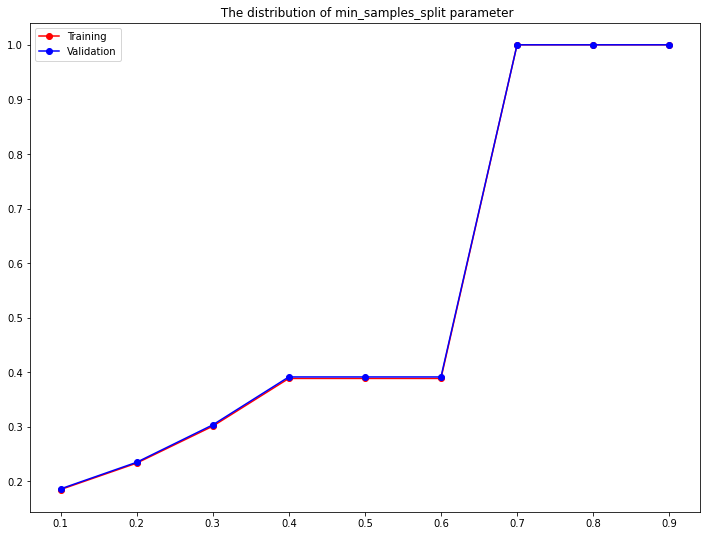

In [ ]:
## Lets look for min_samples_split
%%time
test_and_plot_rforest('min_samples_split',np.arange(0.1,1,0.1))

**Interpretation**

- `min_samples_split` : As the best option will be the default value as we cant find the best option for it same for the `max_leaf_nodes`

<font size = 5>3.Hyperparameter : max_depth  tuning. 

CPU times: user 17min 4s, sys: 1.8 s, total: 17min 6s
Wall time: 8min 47s


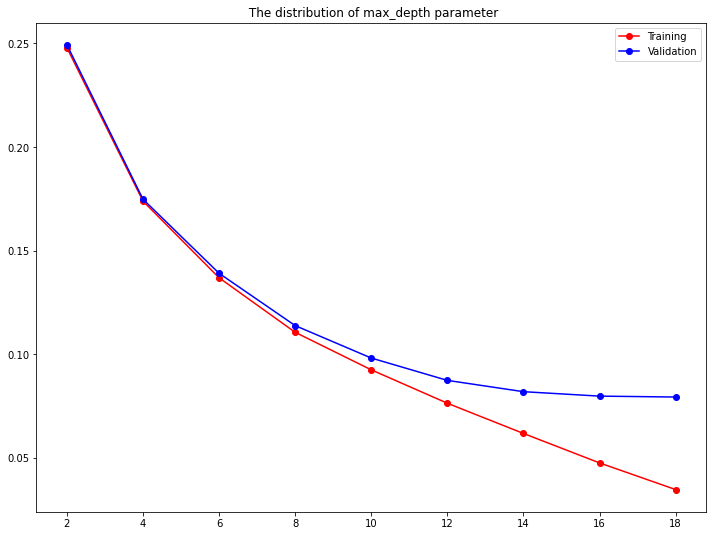

In [ ]:
%%time
test_and_plot_rforest('max_depth',np.arange(2,20,2))

>`max_depth` **parameter best option is 14.**

<font size = 5>4.Hyperparameter : max_features  tuning. 

CPU times: user 19min 44s, sys: 4.01 s, total: 19min 48s
Wall time: 10min 9s


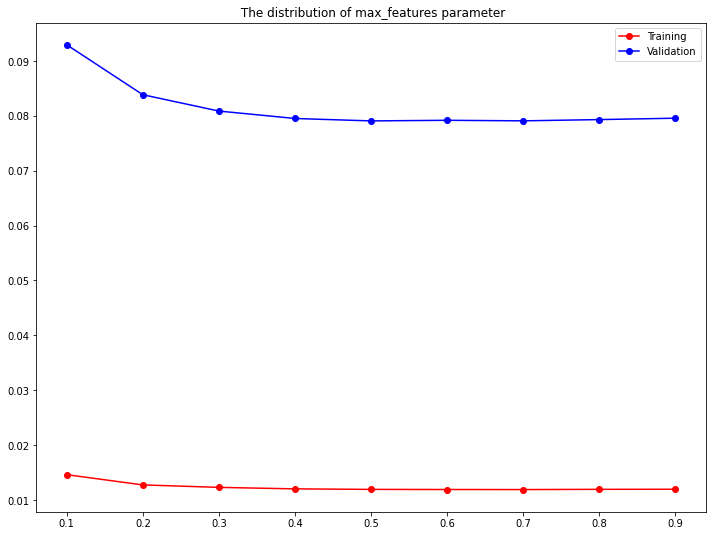

In [ ]:
%%time
test_and_plot_rforest('max_features',np.arange(0.1,1,0.1))

> `max_features` **parameter best option is 0.5.**

#### - The Best hyper-parameter tuning parameter best option is :

1. **n_estimators=30** 
2. **max_depth=14** 
3. **max_features=0.5**

In [ ]:
# Lets model teh best hyperparameter tuning for random forest regression
model=RandomForestRegressor(random_state=42,n_jobs=-1,n_estimators=30,max_depth=14,max_features=0.5).fit(train_inputs,train_targets)

In [ ]:
 print(' The training model score is {:.4f}% \n The validation model score is {:.4f}%'.format(model.score(train_inputs,train_targets)*100,model.score(val_inputs,val_targets)*100))

 The training model score is 93.7281% 
 The validation model score is 91.8592%


<font size = 5> The best model is having the score for the validation set 91.86% and 93.73% for the training set which is less than the former best option.
But here the overfit magnitude is less which seems to be great.

### Analysing the model with the help of Decision Tree.

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

In [ ]:
graph=export_graphviz(model.estimators_[2],feature_names=numerical_cols+encoded_cols,filled=True,rounded=True,max_depth=12)

In [ ]:
graphviz.Source(graph)

<font size =4> Lets check the importance weightage parameter for the best model of RandomforestRegressor.

In [ ]:
## The weightage parameter 
model.feature_importances_

array([7.83306848e-04, 8.47153568e-02, 1.95875761e-03, 2.62065230e-03,
       1.99749833e-04, 1.32654635e-03, 3.12521500e-01, 6.88184006e-04,
       1.49631727e-02, 5.10008390e-03, 1.12053538e-02, 1.18566191e-02,
       8.81381685e-03, 1.34223886e-02, 1.32816464e-03, 2.00317847e-04,
       1.16389519e-02, 5.19036557e-05, 3.49243955e-04, 1.15117096e-04,
       3.74054604e-05, 4.89584318e-01, 2.19068190e-02, 8.95543559e-04,
       7.78159248e-05, 3.47347285e-06, 1.44568980e-04, 2.78219355e-04,
       2.16136389e-06, 1.01279040e-05, 2.69210544e-06, 4.44052905e-04,
       9.02814583e-06, 5.11580116e-05, 1.91152170e-05, 3.51964692e-04,
       3.89105451e-04, 7.10719972e-04, 6.72479426e-04, 5.50043084e-04])

In [ ]:
## Lets find out the best 10 paraneters which have high importance
feature_df=pd.DataFrame({'feature':numerical_cols+encoded_cols,'importance':model.feature_importances_})

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39]), <a list of 40 Text major ticklabel objects>)

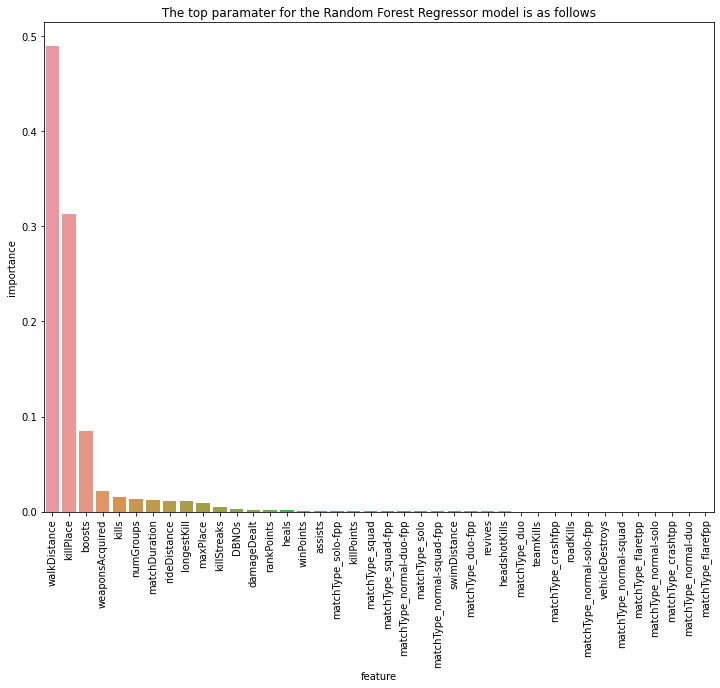

In [ ]:
## Lets sort the values
plt.figure(figsize=(12,9))
sns.barplot(data=feature_df.sort_values('importance',ascending=False),x='feature',y='importance') 
plt.title(' The top paramater for the Random Forest Regressor model is as follows ')
plt.xticks(rotation=90);


In [ ]:
jovian.commit(project='course-real-worl-data-pubg')

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: ··········
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/akkikadwe/course-real-worl-data-pubg


'https://jovian.ai/akkikadwe/course-real-worl-data-pubg'

## 2. Using XGB Boost

In [ ]:
from xgboost import XGBRegressor

In [ ]:
## Lets use one helper function to find out the paramter to be tuning
## Lets define one test paramter
%%time
def test_param_xgb(**param):
    model=XGBRegressor(random_state=42,n_jobs=-1,**param).fit(train_inputs,train_targets)
    print('The training score is {:.2f}  \n validation score is {:.2f}'.format(model.score(train_inputs,train_targets)*100,model.score(val_inputs,val_targets)*100))

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 8.11 µs


In [ ]:
%%time
test_param_xgb(max_depth=6)

[17:49:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The training score is 92.76  
 validation score is 92.28
CPU times: user 2min 34s, sys: 253 ms, total: 2min 34s
Wall time: 1min 19s


<font size =4> The score for the training and validation are 92.8% and 92.3% and we can find out that the difference between teh score is very comparable and hence there is no overfit.

In [ ]:
%%time
test_param_xgb( colsample_bytree=0.4)

[17:52:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The training score is 89.63  
 validation score is 89.41
CPU times: user 48.6 s, sys: 118 ms, total: 48.8 s
Wall time: 25.4 s


In [ ]:
%%time
test_param_xgb( subsample=0.6)

[17:53:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The training score is 89.84  
 validation score is 89.62
CPU times: user 1min 33s, sys: 149 ms, total: 1min 33s
Wall time: 48 s


In [ ]:
%%time
test_param_xgb( subsample=0.3)

[17:56:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The training score is 89.81  
 validation score is 89.58
CPU times: user 1min 32s, sys: 167 ms, total: 1min 32s
Wall time: 48.8 s


In [ ]:
## Lest tune the hyper-parameters for tuning
def test_and_plot_xgb(param_name,param_values):
    train_error,val_error=[],[]
    for value in param_values:
        param={param_name:value}
        model=XGBRegressor(random_state=42,n_jobs=-1,**param).fit(train_inputs,train_targets)
        train_err=1-model.score(train_inputs,train_targets)
        val_err=1-model.score(val_inputs,val_targets)
        train_error.append(train_err)
        val_error.append(val_err)
    ##Making the plot
    plt.figure(figsize=(12,9))
    plt.plot(param_values,train_error,'ro-')
    plt.plot(param_values,val_error,'bo-')
    plt.title(' The distribution of {} parameter'.format(param_name))
    plt.legend(['Training','Validation'])

### 1. Max_depth hyper-paramater

In [ ]:
import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

[17:58:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:59:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:00:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:01:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:04:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:08:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


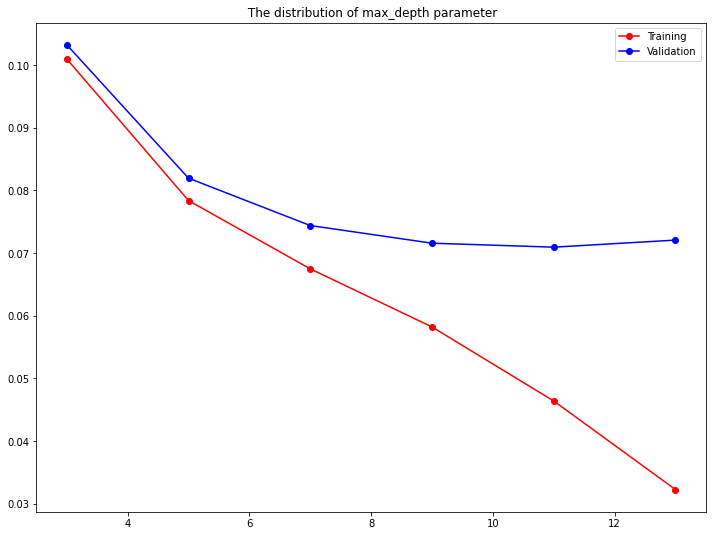

In [ ]:
test_and_plot_xgb('max_depth',np.arange(3,15,2));

><font size=3>**The best option for max_depth is 9.**

### 2. learning hyper-paramater

[18:15:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:16:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:17:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:17:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:18:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:19:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:20:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:21:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

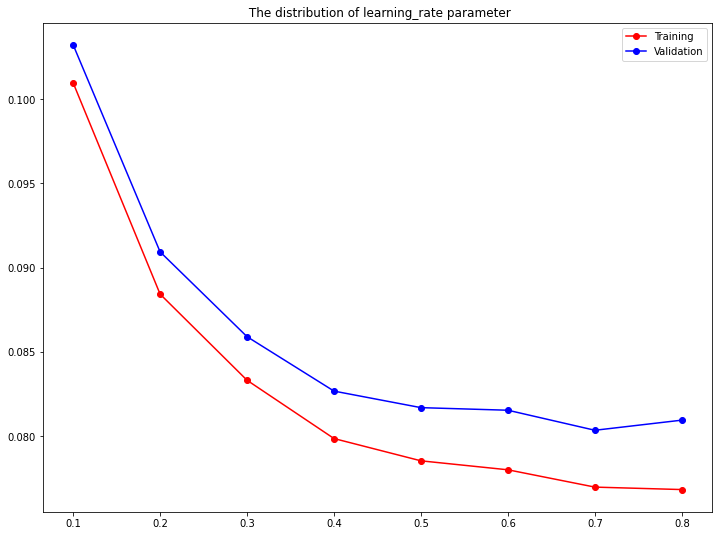

In [ ]:
test_and_plot_xgb('learning_rate',np.arange(0.1,0.9,0.1));

><font size=3>**The best option for learning_rate is 0.5 .**

### 3. booster: string
     

[18:23:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:24:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:24:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


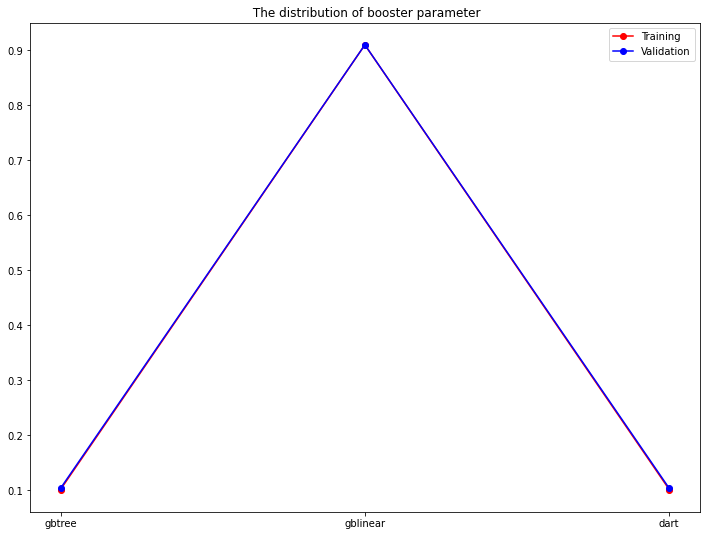

In [ ]:
test_and_plot_xgb('booster',['gbtree', 'gblinear','dart'])

<font size=3>**The best option for booster is gbtree and dart .**

### 4. colsample_bytree

[18:26:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:26:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:27:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:27:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:27:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:28:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:28:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:29:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

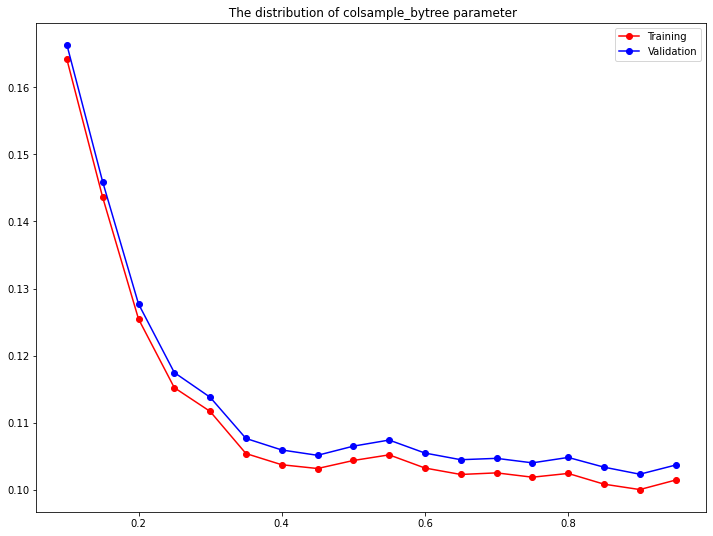

In [ ]:
test_and_plot_xgb('colsample_bytree',np.arange(0.1,1,0.05))

<font size=3>**The best option for col_samplebytree is 0.43.**

### 5. n_estimators hyper-parameters

[18:36:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:36:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:36:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:36:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:36:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:36:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:37:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[18:37:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

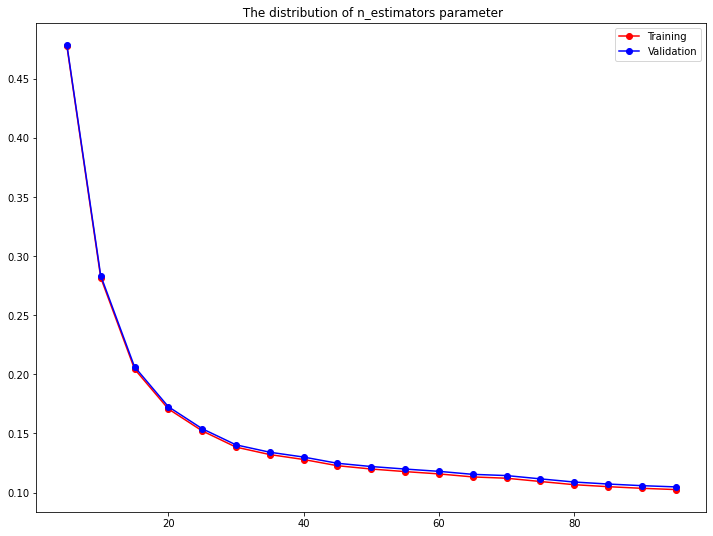

In [ ]:
test_and_plot_xgb('n_estimators',np.arange(5,100,5))

**The best option for `n_estimators` will be default as cant be said from here.**

<font size=5> The best option for XGBboost regressor model hyperparameter are :
1. max_depth=9
2. learning_rate=0.5
3. booster=gbtree
4. colsample_bytree=0.43
5. n_estimators =default

<font size = 5> Design with the help of best hyper parameter tuning for XGB boost.

In [ ]:
## The best model with the hyper-paramter
%%time
model=XGBRegressor(random_state=42,n_jobs=-1,max_depth=9,learning_rate=0.5).fit(train_inputs,train_targets)

[18:55:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
CPU times: user 3min 45s, sys: 241 ms, total: 3min 45s
Wall time: 1min 55s


In [ ]:
model.score(train_inputs,train_targets)*100,model.score(val_inputs,val_targets)*100

(95.41202201565733, 92.14736460051995)

<font size = 4>  Lets change the depth to some less value because using all the hyper parameter in optimim value can cause some less score . 

In [ ]:
## The best model with the hyper-paramter
%%time
model=XGBRegressor(random_state=42,n_jobs=-1,max_depth=7,learning_rate=0.5).fit(train_inputs,train_targets)

[19:30:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
CPU times: user 3min 4s, sys: 705 ms, total: 3min 5s
Wall time: 1min 35s


In [ ]:
model.score(train_inputs,train_targets)*100,model.score(val_inputs,val_targets)*100

(94.08891027338288, 92.46734282398617)

**The validation set score for the hyper-parameter max_depth  as 7 is having score of 92.47% which is 0.32% higher than the max_depth as 9.** 

In [ ]:
model.feature_importances_

array([0.00241553, 0.00890022, 0.00199781, 0.01395917, 0.00157815,
       0.00307369, 0.1384721 , 0.00176753, 0.08394998, 0.004024  ,
       0.00274723, 0.00952912, 0.01520418, 0.02269858, 0.0025417 ,
       0.00306385, 0.00816048, 0.00294646, 0.00217028, 0.00404786,
       0.00239461, 0.44165874, 0.00448095, 0.00259934, 0.03619467,
       0.00582124, 0.00605512, 0.00803624, 0.00194898, 0.00257414,
       0.00060817, 0.03538221, 0.0029054 , 0.01266645, 0.00312579,
       0.01926614, 0.02168574, 0.03839483, 0.01119593, 0.0097574 ],
      dtype=float32)

In [ ]:
feature_df_xgb=pd.DataFrame({'feature':numerical_cols+encoded_cols,'importance':model.feature_importances_})

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

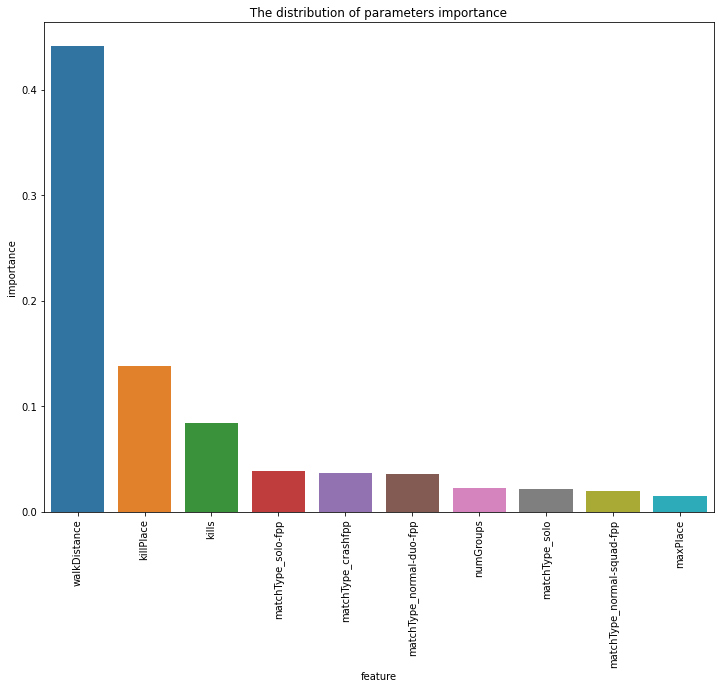

In [ ]:
## Lets check the top which influence in winning prediction percentage using XGB
plt.figure(figsize=(12,9))
sns.barplot(data=feature_df_xgb.sort_values('importance',ascending=False).head(10),x='feature',y='importance') 
plt.title(' The distribution of parameters importance ')
plt.xticks(rotation=90);

In [ ]:
feature_df_xgb.sort_values('importance',ascending=False).head(10)

,feature,importance
21,walkDistance,0.441659
6,killPlace,0.138472
8,kills,0.083950
37,matchType_solo-fpp,0.038395
24,matchType_crashfpp,0.036195
31,matchType_normal-duo-fpp,0.035382
13,numGroups,0.022699
36,matchType_solo,0.021686
35,matchType_normal-squad-fpp,0.019266
12,maxPlace,0.015204


## Submission the test_pdf

Converting the test_df into teh required format 

In [ ]:
test_df

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints
0,9329eb41e215eb,676b23c24e70d6,45b576ab7daa7f,0,0,51.46,0,0,0,73,0,0,0,0.00,1884,squad-fpp,28,28,1500,0,0.0,0,0.000,0,0,588.00,1,0
1,639bd0dcd7bda8,430933124148dd,42a9a0b906c928,0,4,179.10,0,0,2,11,0,2,1,361.90,1811,duo-fpp,48,47,1503,2,4669.0,0,0.000,0,0,2017.00,6,0
2,63d5c8ef8dfe91,0b45f5db20ba99,87e7e4477a048e,1,0,23.40,0,0,4,49,0,0,0,0.00,1793,squad-fpp,28,27,1565,0,0.0,0,0.000,0,0,787.80,4,0
3,cf5b81422591d1,b7497dbdc77f4a,1b9a94f1af67f1,0,0,65.52,0,0,0,54,0,0,0,0.00,1834,duo-fpp,45,44,1465,0,0.0,0,0.000,0,0,1812.00,3,0
4,ee6a295187ba21,6604ce20a1d230,40754a93016066,0,4,330.20,1,2,1,7,0,3,1,60.06,1326,squad-fpp,28,27,1480,1,0.0,0,0.000,0,0,2963.00,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1934169,a316c3a13887d5,80e82180c90951,f276da5fd73536,1,2,381.00,3,0,7,4,1294,4,2,69.27,1292,squad-fpp,22,20,-1,1,0.0,0,0.000,0,0,1799.00,5,1526
1934170,5312146b27d875,147264a127c56e,fb77cbfe094a6b,0,0,0.00,0,0,0,64,1449,0,0,0.00,1301,squad-fpp,27,26,-1,0,0.0,0,0.000,0,0,1195.00,3,1496
1934171,fc8818b5b32ad3,7bbb4779ebedd5,efb74d5f6e9779,0,0,91.96,0,0,3,24,0,1,1,25.38,1314,squad-fpp,29,29,1482,0,0.0,0,7.798,1,0,3327.00,3,0
1934172,a0f91e35f8458f,149a506a64c2b1,3a2cf335bc302f,1,2,138.60,0,0,12,25,0,1,1,67.89,1333,duo-fpp,49,48,1456,1,0.0,0,0.000,0,0,1893.00,4,0


**Lets scale the test_df numerical cols in 0 to 1 range.**

In [ ]:
test_df[numerical_cols]=scaler.transform(test_df[numerical_cols])

In [ ]:
test_df[encoded_cols]=encoder.transform(test_df[categorical_cols])

In [ ]:
test_df=test_df[numerical_cols+encoded_cols]

In [ ]:
test_df

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,matchType_crashfpp,matchType_crashtpp,matchType_duo,matchType_duo-fpp,matchType_flarefpp,matchType_flaretpp,matchType_normal-duo,matchType_normal-duo-fpp,matchType_normal-solo,matchType_normal-solo-fpp,matchType_normal-squad,matchType_normal-squad-fpp,matchType_solo,matchType_solo-fpp,matchType_squad,matchType_squad-fpp
0,0.000000,0.000000,0.009260,0.000000,0.000000,0.000000,0.727273,0.000000,0.000000,0.000000,0.000000,0.830695,0.265306,0.272727,0.272216,0.000000,0.000000,0.0,0.000000,0.00,0.0,0.044177,0.012346,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.000000,0.222222,0.032230,0.000000,0.000000,0.035088,0.101010,0.000000,0.036364,0.055556,0.360100,0.795683,0.469388,0.464646,0.272760,0.105263,0.131893,0.0,0.000000,0.00,0.0,0.151540,0.074074,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.076923,0.000000,0.004211,0.000000,0.000000,0.070175,0.484848,0.000000,0.000000,0.000000,0.000000,0.787050,0.265306,0.262626,0.284004,0.000000,0.000000,0.0,0.000000,0.00,0.0,0.059189,0.049383,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.000000,0.000000,0.011791,0.000000,0.000000,0.000000,0.535354,0.000000,0.000000,0.000000,0.000000,0.806715,0.438776,0.434343,0.265869,0.000000,0.000000,0.0,0.000000,0.00,0.0,0.136138,0.037037,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.222222,0.059421,0.025641,0.086957,0.017544,0.060606,0.000000,0.054545,0.055556,0.059761,0.563070,0.265306,0.262626,0.268589,0.052632,0.000000,0.0,0.000000,0.00,0.0,0.222615,0.049383,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1934169,0.076923,0.111111,0.068562,0.076923,0.000000,0.122807,0.030303,0.609802,0.072727,0.111111,0.068925,0.546763,0.204082,0.191919,0.000000,0.052632,0.000000,0.0,0.000000,0.00,0.0,0.135162,0.061728,0.763764,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1934170,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.636364,0.682846,0.000000,0.000000,0.000000,0.551079,0.255102,0.252525,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.0,0.089782,0.037037,0.748749,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1934171,0.000000,0.000000,0.016548,0.000000,0.000000,0.052632,0.232323,0.000000,0.018182,0.055556,0.025254,0.557314,0.275510,0.282828,0.268952,0.000000,0.000000,0.0,0.002869,0.25,0.0,0.249962,0.037037,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1934172,0.076923,0.111111,0.024942,0.000000,0.000000,0.210526,0.242424,0.000000,0.018182,0.055556,0.067552,0.566427,0.479592,0.474747,0.264236,0.052632,0.000000,0.0,0.000000,0.00,0.0,0.142224,0.049383,0.000000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
## The best model with the hyper-paramter
%%time
model=XGBRegressor(random_state=42,n_jobs=-1,max_depth=7,learning_rate=0.5).fit(train_inputs,train_targets)

[19:08:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
CPU times: user 3min 7s, sys: 305 ms, total: 3min 7s
Wall time: 1min 38s


In [ ]:
pred_test=model.predict(test_df)

In [ ]:
pred_test

array([0.25730616, 0.8841865 , 0.75793135, ..., 0.8794507 , 0.85134125,
       0.07978052], dtype=float32)

In [ ]:
sample_df['winPlacePerc']=pred_test

In [ ]:
sample_df

,Id,winPlacePerc
0,9329eb41e215eb,0.257306
1,639bd0dcd7bda8,0.884187
2,63d5c8ef8dfe91,0.757931
3,cf5b81422591d1,0.522740
4,ee6a295187ba21,0.934668
...,...,...
1934169,a316c3a13887d5,0.798188
1934170,5312146b27d875,0.442042
1934171,fc8818b5b32ad3,0.879451
1934172,a0f91e35f8458f,0.851341


In [ ]:
sample_df.to_csv('submission.csv',index=False)

In [ ]:
sample_df

,Id,winPlacePerc
0,9329eb41e215eb,0.257306
1,639bd0dcd7bda8,0.884187
2,63d5c8ef8dfe91,0.757931
3,cf5b81422591d1,0.522740
4,ee6a295187ba21,0.934668
...,...,...
1934169,a316c3a13887d5,0.798188
1934170,5312146b27d875,0.442042
1934171,fc8818b5b32ad3,0.879451
1934172,a0f91e35f8458f,0.851341


In [ ]:
from IPython.display import FileLink
FileLink('submission.csv') # Doesn't work on Colab, use the file browser instead to download the file.

/content/submission.csv

### Reference:
1. [https://www.kaggle.com/arunsankar/key-insights-from-pubg-data]


In [ ]:
jovian.commit(project='course-real-worl-data-pubg')

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/akkikadwe/course-real-worl-data-pubg


'https://jovian.ai/akkikadwe/course-real-worl-data-pubg'

In [ ]:
jovian.submit(assignment="zerotogbms-project")